<h1 align='center'>Coursera IBM Capstone Final Project</h1>
<h2 align='center'>Prepared by: Stephan G Maher</h2>
<h3 align='center'>Course 9 Week 5 Final Course Submission</h3>

<h4>Import all packages used in this project</h4>

In [1]:
#import packages for scrape,Geo Data and set pandas options
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import numpy as np
import urllib.request
from bs4 import BeautifulSoup
import lxml
import json # library to handle JSON files
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import geocoder
#Import libraries for Clustering
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn import manifold, datasets 
from sklearn.cluster import AgglomerativeClustering 
from sklearn.datasets.samples_generator import make_blobs 
from scipy import ndimage 
from scipy.cluster import hierarchy 
from scipy.spatial import distance_matrix 
from scipy.cluster.hierarchy import fcluster
import scipy
import pylab
#Import geocoder to get location of Toronto
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
#Import Folium to create map.
import folium
from folium import plugins
from folium.plugins import MarkerCluster
#Import geopy Distance calculation formula
from geopy import distance
import seaborn as sns
#set style settings for notebook
from IPython.display import Image
from IPython.core.display import display, HTML
import time
import pprint
import shutil
import os
display(HTML("<style>.container { width:100% !important; }</style>"))
display(HTML("<style>.output_result { max-width:100% !important; }</style>"))
display(HTML("<style>.prompt { display:none !important; }</style>"))



<h4>Get a list of zipcodes in PA for Philadelphia, Montgomery, Delaware and Chester Counties</h4>

In [2]:
#Pull in zipcode data, sort by zip and reindex
path='D:\DataScienceIBM\Course9Capstone\Final Project Answer links\ActualDataUsed\Countiesbyzip.csv'
df = pd.read_csv(path,dtype={'zip':int})
df = df.sort_values(['zip'])
df.reset_index(drop=True, inplace=True)
print(df.shape)

(180, 8)


<h4>Create a DataFrame to hold GeoJson data</h4>
<h4>ZCTA5CE is equivalent to the Zip Code stored as field(zip) int, it is duplicated so I can join the two dataframes(int)</h4>
<h4>Then I change the dtype to Object(text), This is needed to match to the GeoJson file.</h4>

In [3]:
column_names = ['ZCTA5CE', 'latitude', 'longitude'] 
zipr = pd.DataFrame(columns=column_names)
zipr

,ZCTA5CE,latitude,longitude


In [4]:
with open('Pennsylvania5Digit2009.json') as json_data:
    philly_data = json.load(json_data)
    tmp=philly_data
    philly=philly_data['features']

In [5]:
for data in philly:
      philly_zip=data['properties']['ZCTA5CE']
      philly_lat = data['properties']['INTPTLAT']
      philly_lon = data['properties']['INTPTLON']
      zipr = zipr.append({'ZCTA5CE': philly_zip,
                          'latitude': philly_lat,
                          'longitude': philly_lon}, ignore_index=True)
zipr['ZCTA5CE']=pd.to_numeric(zipr['ZCTA5CE'])  
zipr.head()
zipr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1727 entries, 0 to 1726
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   ZCTA5CE    1727 non-null   int64 
 1   latitude   1727 non-null   object
 2   longitude  1727 non-null   object
dtypes: int64(1), object(2)
memory usage: 40.6+ KB


In [6]:
col = ['zip']
col1=['ZCTA5CE']
zipr.sort_values(['ZCTA5CE'])
zipr.reset_index(drop=True,inplace=True)
df.sort_values(['zip'])
df.reset_index(drop=True,inplace=True)
df=df.join(zipr.set_index(col1), on=col,how='left',lsuffix='_left',rsuffix='_right')
cn=['zip']
df1=pd.DataFrame(columns=cn)
df1=df[['zip']]
df1.rename(columns={'zip':'ZCTA5CE'}, inplace=True)
df2=pd.concat([df,df1], axis =1)
df=df2[['zip','ZCTA5CE','latitude','longitude','city','county','population','density']]
df['latitude']=df['latitude'].astype(float)
df['longitude']=df['longitude'].astype(float)
df1=[]
df2=[]
print(df.shape)
df.sort_values(['zip'])
df.reset_index(drop=True, inplace=True)
print(df.shape)
print(df.head())
df.info()

(180, 8)
(180, 8)
     zip  ZCTA5CE   latitude  longitude            city      county  \
0  18054    18054  40.352369 -75.438736      Green Lane  Montgomery   
1  18070    18070  40.431421 -75.540365            Palm  Montgomery   
2  18073    18073  40.386499 -75.474430       Pennsburg  Montgomery   
3  18074    18074  40.316737 -75.515686  Perkiomenville  Montgomery   
4  18076    18076  40.373886 -75.481735        Red Hill  Montgomery   

   population  density  
0        4678    100.7  
1        1108    119.7  
2       10293    188.7  
3        5688    117.6  
4        2806    856.2  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   zip         180 non-null    int32  
 1   ZCTA5CE     180 non-null    int32  
 2   latitude    173 non-null    float64
 3   longitude   173 non-null    float64
 4   city        180 non-null    object 
 5   county   

<h4>The data is joined, but the shape file is missing some of the zip code geo spatial data, so I need to drop those rows</h4>
<h4>The original file has 180 zipcodes</h4>
<h4>7 rows are deleted bringing the total to 173</h4>

In [7]:
df.dropna(subset=["latitude"], axis=0, inplace=True)
df.sort_values(['zip'])
df.reset_index(drop=True,inplace=True)
print(df.shape)
dfn=df
dfn = dfn[dfn.isna().any(axis=1)]
dfn

(173, 8)


,zip,ZCTA5CE,latitude,longitude,city,county,population,density


<h4>I created a get_distance function to find any zip code within a 20 mile radius</h4>

In [8]:
#Function Get_distance from Original Store Location 
def get_distance(lat1, lon1, lat2, lon2):
    dist = None
    base=(lat1,lon1)
    target=(lat2,lon2)
    dist=(distance.distance(base, target).miles)
    return dist
#print "Result", dist
#print "Should be", 0 for zip 19128

<h4>The center of the radius is the zipcode of the original store. 19128</h4>

In [9]:
#Get the latlong of original store zip 19128
idx = 1
idx = df.index[df.zip == 19128]
la=df.columns.get_loc("latitude")
lt=df.columns.get_loc("longitude")
lat1=df.iloc[idx,la]
lon1=df.iloc[idx,lt]
print(lat1)
print(lon1)

85    40.049997
Name: latitude, dtype: float64
85   -75.231737
Name: longitude, dtype: float64


In [10]:
#Run distance function for each zip code in the 4 county area - 
z = []
Distance = []
i=0
d=None
for PC in df['zip']:
    lat2 = df.iloc[i,la]
    lon2 = df.iloc[i,lt]
    d=get_distance(float(lat1), float(lon1),float(lat2), float(lon2))
    if d is None:
        print("Error")
        break
    else:
        i+=1
        z.append(PC)
        Distance.append(d)

<h4>Now I add the distance in miles to my dataframe and remove all distances greater than 20 miles</h4>
<h4>We go from 173 down to 134 records</h4>

In [11]:
#store the ordered list of distances to df_dist 
df_dist=pd.DataFrame(z,columns=['zip'])
df_dist['distance']=Distance
df_dist.sort_values(['zip'])
df_dist.reset_index(drop=True, inplace=True)

In [12]:
col = ['zip']
df=df.join(df_dist.set_index(col), on=col)
print(df.shape)
df_dist=[[]]
df=df[(df['distance'] <= 20)]
df.sort_values(['zip'])
df.reset_index(drop=True, inplace=True)
df=df[['zip','ZCTA5CE','latitude','longitude','county','city','population','density','distance']]
print(df.shape)
df.head()

(173, 9)
(134, 9)


,zip,ZCTA5CE,latitude,longitude,county,city,population,density,distance
0,18915,18915,40.272577,-75.256788,Montgomery,Colmar,645,389.7,15.414202
1,18936,18936,40.225980,-75.229228,Montgomery,Montgomeryville,0,2.1,12.142719
2,18964,18964,40.293506,-75.334136,Montgomery,Souderton,14015,570.1,17.653650
3,19001,19001,40.125489,-75.125851,Montgomery,Abington,17273,1899.1,7.656048
4,19002,19002,40.186587,-75.206777,Montgomery,Ambler,32466,602.4,9.516341


<h4>The following data is added.</h4>
<h4>1. PA IRS Data by zipcode - no of returns, avg salary, no of business returns and avg net profit or loss.</h4>
<h4>2. Census Business Survey Data- counts of all food establishments, establishments with 20 or less employees and Deli's with 20 or less.</h4>
<h4>3. Consumer Spending Dining Out Estmated spending by Household per zip code.</h4></h4>
<h4>3+ Only 57 Consumer Spending Estimates returned. I'm going to adjust the missing data with the mean from each county.</h4>
<h4>4. One year and 3 year growth rates for each zip code based on median home price.</h4>
<h4></h4>

In [13]:
#1. PA IRS Data
path='D:\DataScienceIBM\Course9Capstone\Final Project Answer links\ActualDataUsed\PA-IRSData_Final.csv'
df_irs = pd.read_csv(path,dtype={'zip':int})
df_irs = df_irs.sort_values(['zip'])
df_irs.reset_index(drop=True, inplace=True)
df.sort_values(['zip'])
df.reset_index(drop=True,inplace=True)  
col = ['zip']
df=df.join(df_irs.set_index(col), on=col,how='left',lsuffix='_left',rsuffix='_right')
df=df[['zip','ZCTA5CE','latitude','longitude','county','city','population','density','distance','returns_cnt','avg_salary','bus_rets_cnt','avg_net_bus']]
df=df.dropna()
print(df.shape)
print(df.info())
df.head() 

(127, 13)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 127 entries, 0 to 132
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   zip           127 non-null    int32  
 1   ZCTA5CE       127 non-null    int32  
 2   latitude      127 non-null    float64
 3   longitude     127 non-null    float64
 4   county        127 non-null    object 
 5   city          127 non-null    object 
 6   population    127 non-null    int64  
 7   density       127 non-null    float64
 8   distance      127 non-null    float64
 9   returns_cnt   127 non-null    float64
 10  avg_salary    127 non-null    float64
 11  bus_rets_cnt  127 non-null    float64
 12  avg_net_bus   127 non-null    float64
dtypes: float64(8), int32(2), int64(1), object(2)
memory usage: 12.9+ KB
None


,zip,ZCTA5CE,latitude,longitude,county,city,population,density,distance,returns_cnt,avg_salary,bus_rets_cnt,avg_net_bus
0,18915,18915,40.272577,-75.256788,Montgomery,Colmar,645,389.7,15.414202,790.0,79155.0,100.0,16840.0
1,18936,18936,40.225980,-75.229228,Montgomery,Montgomeryville,0,2.1,12.142719,190.0,66512.0,30.0,7633.0
2,18964,18964,40.293506,-75.334136,Montgomery,Souderton,14015,570.1,17.653650,7430.0,64040.0,960.0,16620.0
3,19001,19001,40.125489,-75.125851,Montgomery,Abington,17273,1899.1,7.656048,8820.0,67115.0,1270.0,13692.0
4,19002,19002,40.186587,-75.206777,Montgomery,Ambler,32466,602.4,9.516341,16780.0,122489.0,3040.0,32227.0


In [14]:
#2. Census Business Survey Data
path='D:\DataScienceIBM\Course9Capstone\Final Project Answer links\ActualDataUsed\BusSurveyData.csv'
df_bis=pd.read_csv(path,dtype={'zip':int})
df_bis = df_bis.sort_values(['zip'])
df_bis.reset_index(drop=True, inplace=True)
df.sort_values(['zip'])
df.reset_index(drop=True,inplace=True)  
col = ['zip']
df=df.join(df_bis.set_index(col), on=col,how='left',lsuffix='_left',rsuffix='_right')
df=df[['zip','ZCTA5CE','latitude','longitude','county','city','population','density','distance','returns_cnt','avg_salary','bus_rets_cnt','avg_net_bus','allfoodsvccnt','allfoodlt20','delilt20']]
df=df.dropna()
print(df.shape)
print(df.info())
df.head() 

(124, 16)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 124 entries, 0 to 126
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   zip            124 non-null    int32  
 1   ZCTA5CE        124 non-null    int32  
 2   latitude       124 non-null    float64
 3   longitude      124 non-null    float64
 4   county         124 non-null    object 
 5   city           124 non-null    object 
 6   population     124 non-null    int64  
 7   density        124 non-null    float64
 8   distance       124 non-null    float64
 9   returns_cnt    124 non-null    float64
 10  avg_salary     124 non-null    float64
 11  bus_rets_cnt   124 non-null    float64
 12  avg_net_bus    124 non-null    float64
 13  allfoodsvccnt  124 non-null    float64
 14  allfoodlt20    124 non-null    float64
 15  delilt20       124 non-null    float64
dtypes: float64(11), int32(2), int64(1), object(2)
memory usage: 15.5+ KB
None


,zip,ZCTA5CE,latitude,longitude,county,city,population,density,distance,returns_cnt,avg_salary,bus_rets_cnt,avg_net_bus,allfoodsvccnt,allfoodlt20,delilt20
0,18915,18915,40.272577,-75.256788,Montgomery,Colmar,645,389.7,15.414202,790.0,79155.0,100.0,16840.0,7.0,0.0,0.0
1,18936,18936,40.225980,-75.229228,Montgomery,Montgomeryville,0,2.1,12.142719,190.0,66512.0,30.0,7633.0,15.0,7.0,3.0
2,18964,18964,40.293506,-75.334136,Montgomery,Souderton,14015,570.1,17.653650,7430.0,64040.0,960.0,16620.0,35.0,28.0,16.0
3,19001,19001,40.125489,-75.125851,Montgomery,Abington,17273,1899.1,7.656048,8820.0,67115.0,1270.0,13692.0,32.0,22.0,15.0
4,19002,19002,40.186587,-75.206777,Montgomery,Ambler,32466,602.4,9.516341,16780.0,122489.0,3040.0,32227.0,63.0,52.0,17.0


In [15]:
#3 Pull Annual Estimate of Consumer Dining Away from Home.
path='D:\DataScienceIBM\Course9Capstone\Final Project Answer links\ActualDataUsed\ConsumerSpendingbyzip.csv'
dfa=pd.read_csv(path,dtype={'zip':int})
dfa = dfa.sort_values(['zip'])
dfa.reset_index(drop=True, inplace=True)
print(dfa.info())
df.sort_values(['zip'])
df.reset_index(drop=True,inplace=True)  
col = ['zip']
df=df.join(dfa.set_index(col), on=col,how='left',lsuffix='_left',rsuffix='_right')
df=df[['zip','ZCTA5CE','latitude','longitude','county','city','population','density','distance','returns_cnt','avg_salary','bus_rets_cnt','avg_net_bus','allfoodsvccnt','allfoodlt20','delilt20','EstAnnDining']]
print(df.shape)
print(df.info())
df.head() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73 entries, 0 to 72
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   zip           73 non-null     int32  
 1   EstAnnDining  73 non-null     float64
dtypes: float64(1), int32(1)
memory usage: 1004.0 bytes
None
(124, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124 entries, 0 to 123
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   zip            124 non-null    int32  
 1   ZCTA5CE        124 non-null    int32  
 2   latitude       124 non-null    float64
 3   longitude      124 non-null    float64
 4   county         124 non-null    object 
 5   city           124 non-null    object 
 6   population     124 non-null    int64  
 7   density        124 non-null    float64
 8   distance       124 non-null    float64
 9   returns_cnt    124 non-null    float64
 10  avg_salary     12

,zip,ZCTA5CE,latitude,longitude,county,city,population,density,distance,returns_cnt,avg_salary,bus_rets_cnt,avg_net_bus,allfoodsvccnt,allfoodlt20,delilt20,EstAnnDining
0,18915,18915,40.272577,-75.256788,Montgomery,Colmar,645,389.7,15.414202,790.0,79155.0,100.0,16840.0,7.0,0.0,0.0,NaN
1,18936,18936,40.225980,-75.229228,Montgomery,Montgomeryville,0,2.1,12.142719,190.0,66512.0,30.0,7633.0,15.0,7.0,3.0,5914.70
2,18964,18964,40.293506,-75.334136,Montgomery,Souderton,14015,570.1,17.653650,7430.0,64040.0,960.0,16620.0,35.0,28.0,16.0,NaN
3,19001,19001,40.125489,-75.125851,Montgomery,Abington,17273,1899.1,7.656048,8820.0,67115.0,1270.0,13692.0,32.0,22.0,15.0,4078.04
4,19002,19002,40.186587,-75.206777,Montgomery,Ambler,32466,602.4,9.516341,16780.0,122489.0,3040.0,32227.0,63.0,52.0,17.0,6625.49


In [16]:
#3+ Adjust missing EstAnnDining with mean value per county
df_county=df[['county','EstAnnDining']]
df_gp=df_county.groupby(['county'],as_index=False).mean()
df_gp

,county,EstAnnDining
0,Chester,7336.45000
1,Delaware,9162.81000
2,Montgomery,5404.56069
3,Philadelphia,2944.84900


In [17]:
#Replace null values with mean per county
df1=df
df1.EstAnnDining=df1.EstAnnDining.mask(df1.EstAnnDining.eq(0)).fillna(
    df1.county.map(df_gp.set_index('county').EstAnnDining)
)
df=df1
df.head()


,zip,ZCTA5CE,latitude,longitude,county,city,population,density,distance,returns_cnt,avg_salary,bus_rets_cnt,avg_net_bus,allfoodsvccnt,allfoodlt20,delilt20,EstAnnDining
0,18915,18915,40.272577,-75.256788,Montgomery,Colmar,645,389.7,15.414202,790.0,79155.0,100.0,16840.0,7.0,0.0,0.0,5404.56069
1,18936,18936,40.225980,-75.229228,Montgomery,Montgomeryville,0,2.1,12.142719,190.0,66512.0,30.0,7633.0,15.0,7.0,3.0,5914.70000
2,18964,18964,40.293506,-75.334136,Montgomery,Souderton,14015,570.1,17.653650,7430.0,64040.0,960.0,16620.0,35.0,28.0,16.0,5404.56069
3,19001,19001,40.125489,-75.125851,Montgomery,Abington,17273,1899.1,7.656048,8820.0,67115.0,1270.0,13692.0,32.0,22.0,15.0,4078.04000
4,19002,19002,40.186587,-75.206777,Montgomery,Ambler,32466,602.4,9.516341,16780.0,122489.0,3040.0,32227.0,63.0,52.0,17.0,6625.49000


In [18]:
#4. Pull and clean Last dataset from Zillow about home prices
path='D:\DataScienceIBM\Course9Capstone\Final Project Answer links\ActualDataUsed\Zillow_zhvi_MedianTrendbyYear.csv'
dfz=pd.read_csv(path,dtype={'zip':int})
dfz = dfz.sort_values(['zip'])
dfz.reset_index(drop=True, inplace=True)
df.sort_values(['zip'])
df.reset_index(drop=True,inplace=True)  
col = ['zip']
df=df.join(dfz.set_index(col), on=col,how='left',lsuffix='_left',rsuffix='_right')
df=df[['zip','ZCTA5CE','latitude','longitude','county','city','population','density','distance','returns_cnt','avg_salary','bus_rets_cnt','avg_net_bus','allfoodsvccnt','allfoodlt20','delilt20','EstAnnDining','1yrgrowth','3yrgrowth']]
#check for any missing data
dfn=df
dfn = dfn[dfn.isna().any(axis=1)]
dfn

,zip,ZCTA5CE,latitude,longitude,county,city,population,density,distance,returns_cnt,avg_salary,bus_rets_cnt,avg_net_bus,allfoodsvccnt,allfoodlt20,delilt20,EstAnnDining,1yrgrowth,3yrgrowth


In [19]:
df['returns_cnt']=df['returns_cnt'].round(0).astype(int)
df['bus_rets_cnt']=df['bus_rets_cnt'].round(0).astype(int)
df[['allfoodsvccnt']]=df[['allfoodsvccnt']].astype(int)
df[['allfoodlt20']]=df[['allfoodlt20']].astype(int)
df[['delilt20']]=df[['delilt20']].astype(int)

<h4>The next step is to remove any zipcodes from the GEOJson file that are not in my list of 4 counties.</h4>
<h4>The original GeoJson file is for the entire state.</h4>
<h4>In order for folium maps to work, I need to adjust the GeoJson to only pull the zipcodes in my dataframe.</h4> 
<h4>I create a new GeoJson file with just the zipcodes that I'm using</h4>

In [20]:
geozips=[]
#If file I'm writing to exists, delete it
filename="PAZipUpdate.json"
if os.path.exists(filename):
    os.remove(filename)
#Convert column from int to Object  
df['ZCTA5CE']=df['ZCTA5CE'].astype(str)
#find and append unique values in my dataframe that match the GeoJson file
for i in range(len(tmp['features'])):
    if tmp['features'][i]['properties']['ZCTA5CE'] in list(df['ZCTA5CE'].unique()):
        geozips.append(tmp['features'][i])
#Create a new GeoJson file
new_json=dict.fromkeys(['type','features'])
new_json['type']='FeatureCollection'
new_json['features']=geozips
#write that file out to disk
open('PAZipUpdate.json','w').write(
    json.dumps(new_json,sort_keys=True, indent=4, separators=(',',':'), )
)



12906161

<h4>Open and load the new GeoJson file to philly_data and set Features as philly</h4>

In [21]:
with open('PAZipUpdate.json') as json_data:
    philly_data = json.load(json_data)
    philly=philly_data['features']

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124 entries, 0 to 123
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   zip            124 non-null    int32  
 1   ZCTA5CE        124 non-null    object 
 2   latitude       124 non-null    float64
 3   longitude      124 non-null    float64
 4   county         124 non-null    object 
 5   city           124 non-null    object 
 6   population     124 non-null    int64  
 7   density        124 non-null    float64
 8   distance       124 non-null    float64
 9   returns_cnt    124 non-null    int32  
 10  avg_salary     124 non-null    float64
 11  bus_rets_cnt   124 non-null    int32  
 12  avg_net_bus    124 non-null    float64
 13  allfoodsvccnt  124 non-null    int32  
 14  allfoodlt20    124 non-null    int32  
 15  delilt20       124 non-null    int32  
 16  EstAnnDining   124 non-null    float64
 17  1yrgrowth      124 non-null    float64
 18  3yrgrowth 

<h4>Next I create a one line dataframe df_home, that contains the characteristics of the original store.</h4>
<h4>I then remove this data from the other zip codes.</h4>

<h4>After adding and cleaning the  data I am left with 124 records</h4>
<h4>Next I will: </h4>
<h4>1. review the data</h4>
<h4>2. import Foursquare data</h4>
<h4>3. Find the best location for a franchise</h4>
<h4>There are 124 records, but one of those records is zip code 19128 where the original store is located</h4>
<h4>I'm going to seperate that record into another dataframe. That will leave 123 recoeds to search</h4>

In [23]:
df_home=df[(df['zip']==19128)]
df_home.head()

,zip,ZCTA5CE,latitude,longitude,county,city,population,density,distance,returns_cnt,avg_salary,bus_rets_cnt,avg_net_bus,allfoodsvccnt,allfoodlt20,delilt20,EstAnnDining,1yrgrowth,3yrgrowth
75,19128,19128,40.049997,-75.231737,Philadelphia,Philadelphia,38309,1928.3,0.0,19000,65776.0,2630,12267.0,73,61,28,4085.16,0.062417,0.094442


In [24]:
df=df[(df['zip']!=19128)]
df.sort_values(['zip'])
df.reset_index(drop=True,inplace=True)  
print(df.shape)
df.head()

(123, 19)


,zip,ZCTA5CE,latitude,longitude,county,city,population,density,distance,returns_cnt,avg_salary,bus_rets_cnt,avg_net_bus,allfoodsvccnt,allfoodlt20,delilt20,EstAnnDining,1yrgrowth,3yrgrowth
0,18915,18915,40.272577,-75.256788,Montgomery,Colmar,645,389.7,15.414202,790,79155.0,100,16840.0,7,0,0,5404.56069,0.039115,0.078511
1,18936,18936,40.225980,-75.229228,Montgomery,Montgomeryville,0,2.1,12.142719,190,66512.0,30,7633.0,15,7,3,5914.70000,0.023853,0.070273
2,18964,18964,40.293506,-75.334136,Montgomery,Souderton,14015,570.1,17.653650,7430,64040.0,960,16620.0,35,28,16,5404.56069,0.042123,0.064187
3,19001,19001,40.125489,-75.125851,Montgomery,Abington,17273,1899.1,7.656048,8820,67115.0,1270,13692.0,32,22,15,4078.04000,0.044682,0.078087
4,19002,19002,40.186587,-75.206777,Montgomery,Ambler,32466,602.4,9.516341,16780,122489.0,3040,32227.0,63,52,17,6625.49000,0.028356,0.051270


<h2 align = 'Center'> Agglomerative Hierarchical Clustering</h2>
<h4>Before getting Foursquare data, lets look at the data I collected</h4>

In [25]:
df1=df
df1_H_feature=df[['population','density','distance','returns_cnt','avg_salary','bus_rets_cnt','allfoodsvccnt','allfoodlt20','delilt20','EstAnnDining','1yrgrowth','3yrgrowth']]
x = df1_H_feature.values #returns a numpy array
from sklearn.preprocessing import MinMaxScaler
min_max_scaler = MinMaxScaler()
feature_mtx = min_max_scaler.fit_transform(x)
agglom = AgglomerativeClustering(n_clusters = 7, linkage = 'complete')
agglom.fit(feature_mtx)
agglom.labels_
df1['cluster_'] = agglom.labels_
df1.head()
print(feature_mtx[0:5])
leng = feature_mtx.shape[0]
D = scipy.zeros([leng,leng])
for i in range(leng):
    for j in range(leng):
        D[i,j] = scipy.spatial.distance.euclidean(feature_mtx[i], feature_mtx[j])
Z = hierarchy.linkage(D, 'complete')
max_d = 7
clusters = fcluster(Z, max_d, criterion='maxclust')
print(clusters)



[[0.00860333 0.02928554 0.78323701 0.02165693 0.15164198 0.01422764
  0.01290323 0.         0.         0.40003161 0.30539231 0.33708743]
 [0.         0.         0.59807568 0.00103128 0.11598491 0.
  0.03870968 0.03167421 0.03125    0.45748102 0.24774387 0.31539266]
 [0.18693895 0.04291586 0.90998666 0.24991406 0.10901312 0.18902439
  0.10322581 0.12669683 0.16666667 0.40003161 0.31675406 0.29936438]
 [0.23039575 0.14332991 0.34413642 0.2976968  0.11768555 0.25203252
  0.09354839 0.09954751 0.15625    0.25064528 0.32642079 0.33597325]
 [0.43304745 0.04535632 0.44942638 0.57133035 0.27385693 0.61178862
  0.19354839 0.23529412 0.17708333 0.53752675 0.26475127 0.26534323]]
[7 7 7 6 5 6 6 6 6 6 6 7 7 7 6 7 6 6 5 6 7 6 7 7 6 4 7 5 6 7 7 6 6 5 7 5 6
 7 7 6 6 7 6 7 7 7 7 3 5 4 7 5 5 7 6 6 5 1 2 5 1 2 5 5 5 6 5 2 3 5 5 2 5 5
 6 6 5 3 3 5 2 5 5 6 3 3 3 3 5 2 3 3 3 2 2 2 5 5 5 5 5 7 7 7 7 7 5 5 5 6 5
 6 5 5 7 7 6 3 5 5 6 5 7]


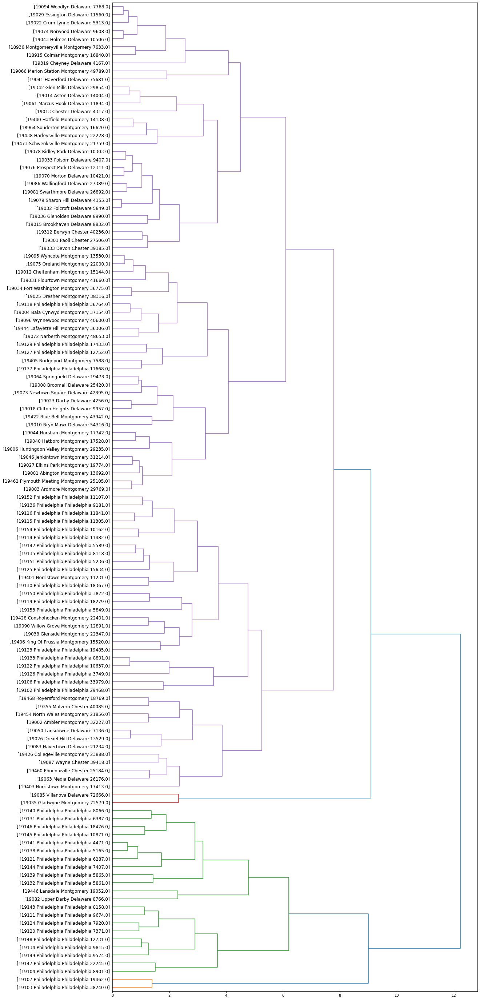

In [26]:
fig = pylab.figure(figsize=(18,50))
def llf(id):
    return '[%s %s %s %s]' % (df1['zip'][id],df1['city'][id], df1['county'][id], float(df1['avg_net_bus'][id]))
dendro = hierarchy.dendrogram(Z,  leaf_label_func=llf, leaf_rotation=0, leaf_font_size =12, orientation = 'right')

<h3>From the graph, we can see 2 groups that are maximized. One is Center City Philadelphia the other is the Villanova and Gladwyne area.</h3>
<h3>I will show you a choropleth map later that demonstrates this, but first I'm going to use another clustering algorithm. </h3>
<h3></h3>
<h3></h3>
<h2 align = center>K-means clustering</h2>

In [27]:
#Get the dataset ready
df1=df
df1_KM_feature=df[['population','density','distance','returns_cnt','avg_salary','bus_rets_cnt','allfoodsvccnt','allfoodlt20','delilt20','EstAnnDining','1yrgrowth','3yrgrowth']]


<h3>Check to get the optimum number of clusters </h3>


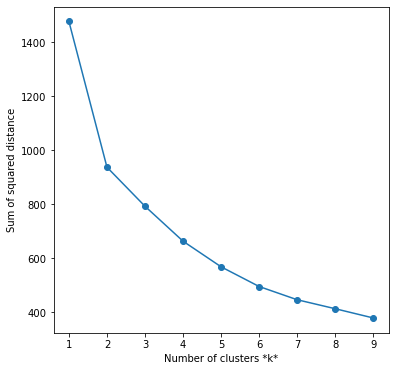

In [28]:
# Use the elbow method to find the optimized number od clusters
# Run the Kmeans algorithm and get the index of data points clusters
from sklearn.preprocessing import StandardScaler
X = StandardScaler().fit_transform(df1_KM_feature)
sse = []
list_k = list(range(1, 10))

for k in list_k:
    km = KMeans(n_clusters=k)
    km.fit(X)
    sse.append(km.inertia_)

# Plot sse against k
plt.figure(figsize=(6, 6))
plt.plot(list_k, sse, '-o')
plt.xlabel(r'Number of clusters *k*')
plt.ylabel('Sum of squared distance');

In [29]:
# Run k_means with the number of clusters from above
from sklearn.preprocessing import StandardScaler
X = StandardScaler().fit_transform(df1_KM_feature)
num_clusters = 4
k_means = KMeans(init="k-means++", n_clusters=num_clusters, n_init=10)
k_means.fit(X)
k_means_labels = k_means.labels_
print(k_means_labels)
df1['labels']=k_means_labels
df_sorted = df1.sort_values(['labels','county'])
df_sorted

[0 0 0 0 2 0 0 2 0 2 0 2 0 0 2 0 0 0 2 0 0 0 0 0 0 0 0 2 2 0 0 2 0 2 0 2 2
 0 0 0 0 0 0 0 0 0 0 1 2 0 0 2 2 0 0 0 2 3 3 2 3 1 2 2 2 0 1 1 1 1 2 1 1 0
 0 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 2 2 0 0 0 0 0 2 2 2 0 2
 2 2 2 2 0 0 2 2 2 0 2 0]


,zip,ZCTA5CE,latitude,longitude,county,city,population,density,distance,returns_cnt,avg_salary,bus_rets_cnt,avg_net_bus,allfoodsvccnt,allfoodlt20,delilt20,EstAnnDining,1yrgrowth,3yrgrowth,cluster_,labels
101,19301,19301,40.042394,-75.480119,Chester,Paoli,6438,735.4,13.181041,3620,118166.0,660,27506.0,28,19,13,7336.45000,0.021709,0.063793,5,0
102,19312,19312,40.032159,-75.451354,Chester,Berwyn,11974,470.0,11.711015,5910,177515.0,1180,40236.0,38,28,11,7336.45000,0.015226,0.038904,5,0
104,19333,19333,40.041872,-75.423597,Chester,Devon,6575,771.1,10.188959,3700,180277.0,670,39185.0,8,3,3,7336.45000,0.025985,0.044449,5,0
8,19008,19008,39.974052,-75.361458,Delaware,Broomall,20794,1209.6,8.649654,10610,79325.0,1660,25420.0,38,25,20,9162.81000,0.045075,0.090695,0,0
12,19014,19014,39.864405,-75.435205,Delaware,Aston,21101,910.5,16.753014,10740,67865.0,1250,14004.0,42,30,12,9162.81000,0.036293,0.070619,5,0
13,19015,19015,39.868633,-75.392945,Delaware,Brookhaven,16665,1957.5,15.160080,8330,49814.0,900,8832.0,23,15,15,9162.81000,0.053202,0.084330,5,0
15,19022,19022,39.861411,-75.336675,Delaware,Crum Lynne,3948,1076.5,14.153980,1690,37671.0,160,5313.0,10,6,4,9162.81000,0.056774,0.093121,5,0
16,19023,19023,39.917032,-75.267602,Delaware,Darby,22146,4284.8,9.369123,9990,34372.0,1510,4256.0,31,27,11,9162.81000,0.080294,0.083424,0,0
20,19029,19029,39.874008,-75.289349,Delaware,Essington,4016,680.4,12.521404,2110,47131.0,200,11560.0,25,17,4,9162.81000,0.047167,0.134579,5,0
22,19032,19032,39.888889,-75.276506,Delaware,Folcroft,6630,2510.6,11.366624,3290,41912.0,450,5849.0,11,7,6,9162.81000,0.093464,0.127451,5,0


In [30]:
k_means_cluster_centers = k_means.cluster_centers_
k_means_cluster_centers

array([[-0.8025385 , -0.5211801 ,  0.09733396, -0.83197057,  0.32056885,
        -0.77493487, -0.66684944, -0.71014088, -0.75867388,  0.57950839,
        -0.40161183, -0.47526154],
       [ 1.10825262,  1.1449017 , -0.56457521,  0.97661153, -0.72912744,
         0.89677899,  0.2457005 ,  0.42232424,  0.59602136, -1.00634697,
         1.32326922,  1.43185651],
       [ 0.27867472, -0.42569807,  0.35533123,  0.44659289,  0.0975563 ,
         0.41338843,  0.39407206,  0.32783932,  0.32015707,  0.03823451,
        -0.50476734, -0.4786883 ],
       [ 0.56166907,  2.59054718, -0.35431982,  0.45147401,  0.02473466,
         0.53655795,  3.9397206 ,  3.83399229,  3.30923665, -1.00677673,
         0.34517501,  0.34240909]])

<h3>Lets get the zip code coordinates for the current store</h3>

In [31]:
address = 'Philadelphia, PA 19128'
geolocator = Nominatim(user_agent="pa_explorer")
location = geolocator.geocode(address)
lat = location.latitude
lon = location.longitude
print('The geograpical coordinates of Roxborough Philadelphia are {}, {}.'.format(lat, lon))

The geograpical coordinates of Roxborough Philadelphia are 39.9527237, -75.1635262.


<h4>Obviously I want to maximize profits, so lets look at the Avg. Net Business income</h4>
<h4>I also want to look at Deli's with less than 20 Employees, since that is our target business.</h4>

In [32]:
#Create a folium map
philly_map = folium.Map(location=[lat,lon], zoom_start=10)
#add Marker Cluster
marker_cluster=MarkerCluster().add_to(philly_map)
#add Markers to Cluster
for row in df.itertuples():
    folium.Marker(location=[row.latitude,row.longitude],
    popup=('County:{county}<br>'
    'City={city}<br>'
    'Zip={zip}<br>'
    'Population={pop}<br>'
    'Population Density={pd}<br>'
    'Distance={dist} Miles<br>'
    'Avg Salary={ag}<br>'
    'Annual Dining Expenditure={ad}<br>')
    .format(county=row.county,
    city=row.city,
    zip=str(row.zip),
    pop=str(row.population),
    pd=str(row.density),
    dist=str(round(row.distance,1)),
    ag=str(row.avg_salary),
    ad=str(row.EstAnnDining))).add_to(marker_cluster)
for row in df_home.itertuples():
    folium.Marker(location=[row.latitude,row.longitude],
    popup=('Zip={zip}<br>'
    'Population={pop}<br>'
    'Population Density={pd}<br>'
    'Distance from center={dist} Miles<br>'
    'Avg Salary={ag}<br>'
    'Annual Dining Expenditure={ad}<br>'
    'Original Store Loc.<br>'
    'Go Eagles<br>')
    .format(zip=str(row.zip),
    pop=str(row.population),
    pd=str(row.density),
    dist=str(round(row.distance,1)),
    ag=str(row.avg_salary),
    ad=str(row.EstAnnDining)),
    icon=folium.Icon(color='black',
    icon_color='white',
    icon=None)).add_to(philly_map)

philly_GEO = r'PaZipUpdate.json'
#Generate Coropleth map
philly_map.choropleth(
    geo_data=philly_GEO,
    name='Phila GMA Avg. Net Business',
    data=df,
    columns=['ZCTA5CE', 'avg_net_bus'],
    key_on='feature.properties.ZCTA5CE',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Philadelphia Metropolitan Area Avg Business Income by Zip',
)
folium.LayerControl().add_to(philly_map)


#display map
philly_map

<h3>After zooming in on the map,to see the detail for Gladwynn and Villanova, it looks like the center of the wealth in the</h3>
<h3>metropolitan area is centered aroud Bryn Mahr, 19010. The zipcode for Gladwynn is 19035. Finding the distance</h3>
<h3>between these two points and then creating a radius around Bryn Mahr should get us the list of zip</h3> 
<h3>codes we need to do a further analysis using Foursquare.</h3>
<h3></h3>

In [33]:
#Get the latlong of the Bryn Mahr, and Gladwynn and run a radius.
dist=[]
idx = 1
idx = df.index[df.zip == 19010]
la=df.columns.get_loc("latitude")
lt=df.columns.get_loc("longitude")
lat1=df.iloc[idx,la]
lon1=df.iloc[idx,lt]
print(lat1)
print(lon1)
idx = 1
idx = df.index[df.zip == 19035]
la=df.columns.get_loc("latitude")
lt=df.columns.get_loc("longitude")
lat2=df.iloc[idx,la]
lon2=df.iloc[idx,lt]
print(lat1)
print(lon1)
dist=get_distance(float(lat1),float(lon1),float(lat2),float(lon2))
dist

9    40.022782
Name: latitude, dtype: float64
9   -75.33007
Name: longitude, dtype: float64
9    40.022782
Name: latitude, dtype: float64
9   -75.33007
Name: longitude, dtype: float64


3.144380943542137

In [34]:
#Run distance function for each zip code in the specified area 3.5 miles from the center 
z = []
Distance = []
i=0
d=None
for PC in df['zip']:
    lat2 = df.iloc[i,la]
    lon2 = df.iloc[i,lt]
    d=get_distance(float(lat1), float(lon1),float(lat2), float(lon2))
    if d is None:
        print("Error")
        break
    else:
        i+=1
        z.append(PC)
        Distance.append(d)
#store the ordered list of distances to df_dist and create a new column in our data frame distance1. Only keep a radius of zipcodes within
#3.5 miles of the store
df_dist=pd.DataFrame(z,columns=['zip'])
df_dist['distance1']=Distance
df_dist.sort_values(['zip'])
df_dist.reset_index(drop=True, inplace=True)
col = ['zip']
df=df.join(df_dist.set_index(col), on=col)
print(df.shape)
df_dist=[[]]
df=df[(df['distance1'] <= 3.5)]
df.sort_values(['zip'])
df.reset_index(drop=True, inplace=True)
df=df[['zip','ZCTA5CE','latitude','longitude','county','city','population','density','distance','returns_cnt','avg_salary','bus_rets_cnt','avg_net_bus','allfoodsvccnt','allfoodlt20','delilt20','EstAnnDining','1yrgrowth','3yrgrowth','distance1']]
print(df.shape)
df.head()

(123, 22)
(7, 20)


,zip,ZCTA5CE,latitude,longitude,county,city,population,density,distance,returns_cnt,avg_salary,bus_rets_cnt,avg_net_bus,allfoodsvccnt,allfoodlt20,delilt20,EstAnnDining,1yrgrowth,3yrgrowth,distance1
0,19003,19003,40.001566,-75.299032,Montgomery,Ardmore,13565,2489.1,4.889375,6710,104417.0,1400,29769.0,54,43,18,5404.56069,0.050055,0.085549,2.203190
1,19010,19010,40.022782,-75.330070,Delaware,Bryn Mawr,21027,966.8,5.542680,8980,207748.0,2010,54316.0,66,48,20,7605.44000,0.048085,0.075343,0.000000
2,19035,19035,40.049159,-75.281719,Montgomery,Gladwyne,3903,306.6,2.650848,2060,379959.0,530,72579.0,5,0,0,10732.16000,0.023764,0.037218,3.144381
3,19041,19041,40.004484,-75.320002,Delaware,Haverford,6250,730.5,5.637180,3030,232539.0,700,75681.0,10,4,3,9162.81000,0.041102,0.054043,1.370754
4,19083,19083,39.977072,-75.312310,Delaware,Havertown,36282,2493.0,6.601978,18280,86186.0,3170,21234.0,62,49,19,9162.81000,0.067518,0.109161,3.291453


<h3>Lets map our new location</h3>
<h3></h3>
<h3></h3>

In [35]:
#Create a folium map
philly_map = folium.Map(location=[lat,lon], zoom_start=10)
#add Marker Cluster
marker_cluster=MarkerCluster().add_to(philly_map)
#add Markers to Cluster
for row in df.itertuples():
    folium.Marker(location=[row.latitude,row.longitude],
    popup=('County:{county}<br>'
    'City={city}<br>'
    'Zip={zip}<br>'
    'Population={pop}<br>'
    'Population Density={pd}<br>'
    'Distance={dist} Miles<br>'
    'Avg Salary={ag}<br>'
    'Annual Dining Expenditure={ad}<br>')
    .format(county=row.county,
    city=row.city,
    zip=str(row.zip),
    pop=str(row.population),
    pd=str(row.density),
    dist=str(round(row.distance,1)),
    ag=str(row.avg_salary),
    ad=str(row.EstAnnDining))).add_to(marker_cluster)


philly_GEO = r'PaZipUpdate.json'
#Generate Coropleth map
philly_map.choropleth(
    geo_data=philly_GEO,
    name='Phila GMA Avg. Net Business',
    data=df,
    columns=['ZCTA5CE', 'avg_net_bus'],
    key_on='feature.properties.ZCTA5CE',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Philadelphia Metropolitan Area Avg Business Income by Zip',
)
folium.LayerControl().add_to(philly_map)

#display map
philly_map

<h3>Now I will pull the Foursquare Data.</h3>
<h3>I had a number of errors trying to recursively pull this data</h3>
<h3>I'm goimg to pull 5 dataframes for different categories and layer them on the map</h3>
<h3>There is a limit on the number of layers you can use, so I may have more than one map.</h3>

In [36]:
dfv=pd.DataFrame()

In [37]:
def get_VenueItems(CLIENT_ID, CLIENT_SECRET,VERSION,search_query,radius, LIMIT):
    i=0
    for PC in df['zip']:    
        lat = df.iloc[i,la]
        lon = df.iloc[i,lt]
        url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format         (CLIENT_ID, CLIENT_SECRET, lat, lon, VERSION, search_query, radius, LIMIT)
        results = requests.get(url).json()
        venues = results['response']['venues']
        dfa = json_normalize(venues)
        dfa.reindex()
        if i==0:
            dfv=dfa
            i+=1
        elif i < 6:
            dfv=dfv.append(dfa,ignore_index=True)
            dfv.reset_index(drop=True,inplace=True)
            i+=1
        else:
            dfv=dfv.append(dfa,ignore_index=True)
            dfv.reset_index(drop=True,inplace=True)
            filter_VenueItems(dfv)
            i+=1
    print(dfv)
    return dfv

In [38]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        
        return None
    else:
        print(categories_list[0]['name'])
        return categories_list[0]['name']

In [39]:
def filter_VenueItems(dataframe):  
    # keep only columns that include venue name, and anything that is associated with location
    filtered_columns = ['name', 'categories'] + [col for col in dataframe.columns if col.startswith('location.')] + ['id']
    dataframe_filtered = dataframe.loc[:, filtered_columns]
    return dfv

In [40]:
def postFilter(dataframe_filtered):
    dataframe_filtered['categories'] = dataframe_filtered.apply(get_category_type, axis=1)

    # clean column names by keeping only last term
    dataframe_filtered.columns = [column.split('.')[-1] for column in dataframe_filtered.columns]
    return dataframe_filtered

In [41]:
#remove ID and Secret before posting
CLIENT_ID = 'QXBRRBOS22KLNITA013HBQPZ0ZQ5EPT3QQY4P5BVWF3EGJPS' # your Foursquare ID
CLIENT_SECRET = '5OXNVM4M2C11UDXGAKVNCHNY5GXCPRAXMMYDC1VUOKBL0RWQ' # your Foursquare Secret
VERSION = '20180604'
LIMIT=50
radius=1500

<h3>Here you can see the categories I chose.</h3>
<h3>I selected Delis and Sandwich Places</h3>
<h3>and finally I did a search of some areas where people congregate</h3>

In [42]:
#Search and Clean FourSquare data.
search_query='Deli / Bodega'
df_food=get_VenueItems(CLIENT_ID, CLIENT_SECRET,VERSION,search_query,radius, LIMIT)
df_food=postFilter(df_food)
search_query='Sandwich Place'
df_sand=get_VenueItems(CLIENT_ID, CLIENT_SECRET,VERSION,search_query,radius, LIMIT)
df_sand=postFilter(df_sand)
search_query='College & University'
df_sch=get_VenueItems(CLIENT_ID, CLIENT_SECRET,VERSION,search_query,radius, LIMIT)
df_sch=postFilter(df_sch)
search_query='Shopping Plaza'
df_plaz=get_VenueItems(CLIENT_ID, CLIENT_SECRET,VERSION,search_query,radius, LIMIT)
df_plaz=postFilter(df_plaz)
df_food.reset_index(drop=True, inplace=True)
df_food=df_food[['name','lat','lng','postalCode','formattedAddress']]
df_sand.reset_index(drop=True, inplace=True)
df_sand=df_sand[['name','lat','lng','postalCode','formattedAddress']]
df_sch.reset_index(drop=True, inplace=True)
df_sch=df_sch[['name','lat','lng','postalCode','formattedAddress']]
df_plaz.reset_index(drop=True, inplace=True)
df_plaz=df_plaz[['name','lat','lng','postalCode','formattedAddress']]
df_name=df_food.iloc[:,0]
df_loc=df_food.iloc[:,3:7]
df_food=pd.concat([df_name,df_loc],axis=1)
df_food=df_food.dropna()
df_sand=df_sand.dropna()
s=np.array([0,25,27,28,47,48])
df_sch=df_sch.iloc[s]
s=np.array([0,1,2,5,7,8,12,15])
df_plaz=df_plaz.iloc[s]
df_venues=df_food
df_venues=df_venues.append(df_sand, ignore_index=True)
df_venues=df_venues.append(df_sch , ignore_index=True)
df_venues=df_venues.append(df_plaz, ignore_index=True)
df_venues

                          id                                     name  \
0   4b09acfdf964a520751b23e3                         Rittenhouse Deli   
1   4b5f318bf964a5205fac29e3                           Jeannie's Deli   
2   5943cffc93bd63761681abf1                       Delice et Chocolat   
3   4c58de3ed3aee21e780f6755                     J&G Lunch Meat Villa   
4   4f3211ef19833175d60d890a                   Izenbergs Gourmet Deli   
5   5e9a9ee3d10b66000805379e   Aziatisch - Asian Contemporary Cuisine   
6   4d3f1e70d2c8f04d78317972                        Domino's Delivery   
7   5d5bf87d48dfe80008e91dc5                       Bodega by La Cabra   
8   4f32577e19836c91c7ce443d           Ardmore Cheese-Graumann's Deli   
9   5d5bf87d48dfe80008e91dc5                       Bodega by La Cabra   
10  4f32577e19836c91c7ce443d           Ardmore Cheese-Graumann's Deli   
11  4d3f1e70d2c8f04d78317972                        Domino's Delivery   
12  4c449b0bdcd61b8d7e937b56                       

,name,lat,lng,postalCode,formattedAddress
0,Rittenhouse Deli,40.005965,-75.291571,19003,"[68 Rittenhouse Place, Philadelphia, PA 19003,..."
1,Jeannie's Deli,40.006705,-75.292805,19003,"[2 E Athens Ave, Ardmore, PA 19003, United Sta..."
2,Delice et Chocolat,40.007846,-75.290556,19003,"[7 Station Ave, Ardmore, PA 19003, United States]"
3,J&G Lunch Meat Villa,39.997316,-75.291812,19003,"[1523 Wynnewood Rd (County Line Road), Ardmore..."
4,Izenbergs Gourmet Deli,40.007873,-75.285966,19003,"[120 Coulter Ave, Ardmore, PA 19003, United St..."
5,Aziatisch - Asian Contemporary Cuisine,40.008125,-75.286528,19003,"[120 Coulter Ave, Ardmore, PA 19003, United St..."
6,Domino's Delivery,40.009357,-75.305786,19041,"[370 Lancaster Ave, Haverford, PA 19041, Unite..."
7,Bodega by La Cabra,40.017626,-75.322200,19010,"[810 Glenbrook Ave, Bryn Mawr, PA 19010, Unite..."
8,Ardmore Cheese-Graumann's Deli,40.014996,-75.316252,19010,"[749 Polo Rd, Bryn Mawr, PA 19010, United States]"
9,Bodega by La Cabra,40.017626,-75.322200,19010,"[810 Glenbrook Ave, Bryn Mawr, PA 19010, Unite..."


In [43]:
df_venues=df_venues.dropna()
df_venues

,name,lat,lng,postalCode,formattedAddress
0,Rittenhouse Deli,40.005965,-75.291571,19003,"[68 Rittenhouse Place, Philadelphia, PA 19003,..."
1,Jeannie's Deli,40.006705,-75.292805,19003,"[2 E Athens Ave, Ardmore, PA 19003, United Sta..."
2,Delice et Chocolat,40.007846,-75.290556,19003,"[7 Station Ave, Ardmore, PA 19003, United States]"
3,J&G Lunch Meat Villa,39.997316,-75.291812,19003,"[1523 Wynnewood Rd (County Line Road), Ardmore..."
4,Izenbergs Gourmet Deli,40.007873,-75.285966,19003,"[120 Coulter Ave, Ardmore, PA 19003, United St..."
5,Aziatisch - Asian Contemporary Cuisine,40.008125,-75.286528,19003,"[120 Coulter Ave, Ardmore, PA 19003, United St..."
6,Domino's Delivery,40.009357,-75.305786,19041,"[370 Lancaster Ave, Haverford, PA 19041, Unite..."
7,Bodega by La Cabra,40.017626,-75.322200,19010,"[810 Glenbrook Ave, Bryn Mawr, PA 19010, Unite..."
8,Ardmore Cheese-Graumann's Deli,40.014996,-75.316252,19010,"[749 Polo Rd, Bryn Mawr, PA 19010, United States]"
9,Bodega by La Cabra,40.017626,-75.322200,19010,"[810 Glenbrook Ave, Bryn Mawr, PA 19010, Unite..."


<h3>I now have some categories that I need to map as layers.</h3>
<h3>We should get a good idea of where we stand.</h3>
<h3></h3>


In [44]:
latitude=lat
longitude=lon

In [45]:

#Create a folium map
philly_map = folium.Map(location=[latitude,longitude], zoom_start=10)
#add circle Markers
for name, lat, lng, postalCode, formattedAddress in zip(df_venues['name'].to_string(),df_venues['lat'], df_venues['lng'], df_venues['postalCode'].to_string(), df_venues['formattedAddress'].to_string()):
    label = '{}, {}, {}'.format(name, postalCode, formattedAddress)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='green',
        fill=True,
        fill_color='green',
        fill_opacity=0.7,
        parse_html=False).add_to(philly_map)






philly_GEO = r'PaZipUpdate.json'
#Generate Coropleth map
philly_map.choropleth(
    geo_data=philly_GEO,
    name='Phila GMA Business Locations',
    data=df,
    columns=['ZCTA5CE', 'avg_net_bus'],
    key_on='feature.properties.ZCTA5CE',
    fill_color='YlOrRd', 
    fill_opacity=0.3, 
    line_opacity=0.5,
    legend_name='Philadelphia Metropolitan Area Avg Business Income by Zip'
)
folium.LayerControl().add_to(philly_map)


philly_map